# Lab Assignment Two: Exploring Image Data 
LJ Brown, Joe McGuire, Henry Warren, Mike Lefebvre, Xingming Qu

## 1. Business Understanding

add business understanding here

## 2. Dataset Description

Dataset: Food-101

Description: A challenging data set of 101 food categories, with 101'000 images. For each class, 250 manually reviewed test images are provided as well as 750 training images.

However, in this lab, we manually chose 5 food categories (0_chicken_wings, 1_dumplings, 2_hot_dog，3_ramen，4_sushi), each category has 300 training images and 50 test images. In addition, we also resize all the images to 60x60x3 in advance to reduce computation time

Total training images: 1500 <br>
Total test images: 250


Reference: https://www.vision.ee.ethz.ch/datasets_extra/food-101/


## 3. Data Preparation

### 3.1 Read in your images as numpy arrays. 
Resized images as 60x60x3 in advance

In [35]:
## you might need to install python opencv first 
## pip install opencv-python
import pandas as pd
import numpy as np
import cv2
import os
from os.path import join as pjoin
from matplotlib import pyplot as plt
import random
import warnings
warnings.filterwarnings('ignore')

In [36]:
#############################Change your folder first#############################

train_dir='food_resized/train/'
test_dir='food_resized/test/'


# Each label 0_chicken_wings, 1_dumplings, 2_hot_dog，3_ramen，4_sushi
Label_list=['chicken_wings', 'dumplings', 'hot_dog','ramen','sushi']
def readDataAndGetLabel(data_dir):
    data=[]
    label=[]
    for img_dir in os.listdir(data_dir):
        each_dir= pjoin(data_dir, img_dir)      #get each folder's name, 0_chicken_wings
        each_lable=int(img_dir.split('_')[0])   # use the firsr number as label
        for img in os.listdir(each_dir): 
            img_dir = pjoin(each_dir, img)
            readimg=cv2.imread(img_dir)    # read each images
            data.append(readimg)
            label.append(each_lable)
    return data,label
    
X_train,Y_train=readDataAndGetLabel(train_dir)
X_test,Y_test=readDataAndGetLabel(test_dir)

### 3.2 Visualize several images.

Show some pictures from training set


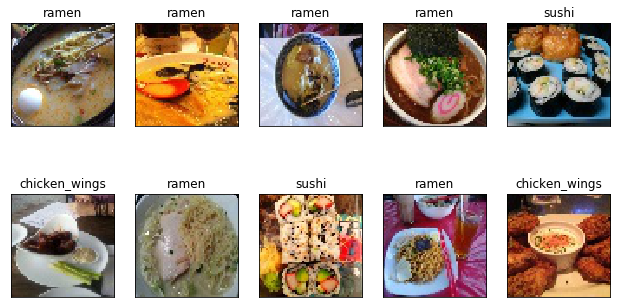

In [37]:
def randomShowImg(data,imRange, label,n_row=2, n_col=5):
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)    
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        index=random.randint(0,imRange)  # random selecte pictures
        img=data[index]
        img = img[:,:,[2,1,0]] # change rgb channels to display 
        
        plt.imshow(img)
        plt.title(Label_list[label[index]], size=12)
        plt.xticks(())
        plt.yticks(())    
    
# show some training pictures 
print('Show some pictures from training set')
randomShowImg(X_train,1499,Y_train)

Show some pictures from test set


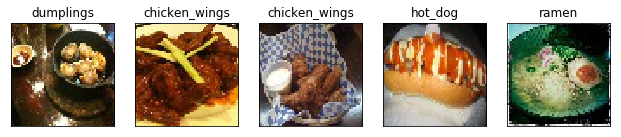

In [38]:
# show some test pictures 
print('Show some pictures from test set')
randomShowImg(X_test,249,Y_test,1,5)

### 3.3 Linearize the images to create a table of 1-D image features (each row should be one image).   

In [39]:
%%time 
##convert all the data to np array
npX_train=X_train[0].reshape((1, -1)) #reshape to make each row be one image
for i in range(1,len(X_train)):
    npX_train=np.vstack([npX_train,X_train[i].reshape((1, -1))])
    
npX_test=X_test[0].reshape((1, -1)) #reshape to make each row be one image
for i in range(1,len(X_test)):
    npX_test=np.vstack([npX_test,X_test[i].reshape((1, -1))])
    
# Convert label to np array
npY_train=np.array(Y_train)
npY_test=np.array(Y_test)

## Then scale all the pixel to 0-1
npX_train=npX_train/255
npX_test=npX_test/255

print(npX_train.shape)
print(npX_test.shape)
print(npY_train.shape)
print(npY_test.shape)

(1500, 10800)
(250, 10800)
(1500,)
(250,)
CPU times: user 3.62 s, sys: 3.42 s, total: 7.03 s
Wall time: 6.91 s


In [40]:
print('There are',npX_train.shape[0],'and',npX_test.shape[0],'samples in training set and test set, respectively')
print('n_features:',npX_train.shape[1])
print('n_classes:',len(Label_list))
print('Original Image Sizes: 60x60x3=10800')

There are 1500 and 250 samples in training set and test set, respectively
n_features: 10800
n_classes: 5
Original Image Sizes: 60x60x3=10800


In [41]:
## print some examples
print(npX_train[:3])
print('------------------------------------------------------------------------------------')
print(npX_test[:3])

[[0.17647059 0.19215686 0.38431373 ... 0.03137255 0.05098039 0.10980392]
 [0.49019608 0.56862745 0.75294118 ... 0.4        0.41960784 0.89803922]
 [0.11764706 0.18039216 0.27058824 ... 0.04313725 0.14901961 0.1372549 ]]
------------------------------------------------------------------------------------
[[0.16470588 0.23529412 0.2627451  ... 0.53333333 0.44705882 0.4       ]
 [0.64705882 0.53333333 0.33333333 ... 0.88627451 0.68235294 0.41960784]
 [0.         0.01960784 0.29019608 ... 0.36862745 0.36862745 0.32156863]]


## 4 Data Reduction

### 4.1 Perform linear dimensionality reduction of the images using principal components analysis


In [42]:
# lets do some PCA of the features and go from 10800 features to 20 features
from sklearn.decomposition import PCA

n_components = 600
print ("Extracting the top %d \"eigenfood\" from %d training images" % (
    n_components, npX_train.shape[0]))
pca = PCA(n_components=n_components)
%time pca.fit(npX_train.copy())


Extracting the top 600 "eigenfood" from 1500 training images
CPU times: user 9.29 s, sys: 708 ms, total: 10 s
Wall time: 2.75 s


PCA(copy=True, iterated_power='auto', n_components=600, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

#### 4.1.2 Visualize the explained variance of each component.

In [43]:
def plot_explained_variance(pca):
    import plotly
    from plotly.graph_objs import Bar, Line
    from plotly.graph_objs import Scatter, Layout
    from plotly.graph_objs.scatter import Marker
    from plotly.graph_objs.layout import XAxis, YAxis
    plotly.offline.init_notebook_mode() # run at the start of every notebook
    
    explained_var = pca.explained_variance_ratio_
    cum_var_exp = np.cumsum(explained_var)
    
    plotly.offline.iplot({
        "data": [Bar(y=explained_var, name='individual explained variance'),
                 Scatter(y=cum_var_exp, name='cumulative explained variance')
            ],
        "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'))
    })
        
plot_explained_variance(pca)

In general, we want PCA to retain 95% of the variance. We can see from the image above that when the principal components >= 566, the cumulative explained varience >= 95%. So 566 dimensions are required to adequately represent our image data.

Or we can just use the first 50 dimensions to represent our image data, bescause the rest components are trivial compared to the first 50 dimensions. But in fact the reconstruct effect is not good if we just use 50 dimensions...we still need to use 566 dimensions

### 4.2  Perform non-linear dimensionality reduction of our image data.

In [44]:
%%time
from sklearn.decomposition import KernelPCA

n_components = 566

print ("Extracting the top %d \"eigenfood\" from %d training images" % ( n_components, npX_train.shape[0]))
kpca = KernelPCA(n_components=n_components, kernel='rbf', 
                fit_inverse_transform=True, gamma=12, # very sensitive to the gamma parameter,
                remove_zero_eig=True)  
kpca.fit(npX_train.copy())

Extracting the top 566 "eigenfood" from 1500 training images
CPU times: user 3.74 s, sys: 248 ms, total: 3.98 s
Wall time: 1.14 s


### 4.3 Compare the representation using non-linear dimensions to using linear dimensions.

In [45]:
# convert_to_grey will be used for compute the SSIM
def convert_to_grey(data):
    ori_recover=data
    ori_recover=np.trunc(ori_recover*255)
    ori_recover=np.array(ori_recover,dtype=np.uint8)
    ori_recover=cv2.cvtColor(ori_recover, cv2.COLOR_BGR2GRAY)
    return ori_recover
    

In [46]:
# So let write a "simple" Structural Similarity(SSIM) function
def SSIM(X,Y):
    
    # we don't want the luminosity to be a factor. So before compute SSIM,
    # we need to make X,Y in the same luminosity level
    Y=Y*(X.sum()/Y.sum())
    
    ux=X.mean()
    uy=Y.mean()

    sigma2x=(X-ux)**2
    sigma2y=(Y-uy)**2
    sigmaxy=(X-ux)*(Y-uy)
    sigma2x=sigma2x.mean()
    sigma2y=sigma2y.mean()
    sigmaxy=sigmaxy.mean()

    k1=0.01
    k2=0.03
    L=255
    c1=(k1*L)**2
    c2=(k2*L)**2
    c3=c2/2

    l=(2*ux*uy+c1)/(ux*ux+uy*uy+c1)
    c=(2*sigma2x**1/2 * sigma2y**1/2 +c2)/(sigma2x+sigma2y+c2)
    s=(sigmaxy+c3)/(sigma2x**1/2  * sigma2y**1/2 +c3)
    re=l*c*s
    return re

In [47]:
from ipywidgets import widgets
import warnings
n_samples=1500

warnings.simplefilter('ignore', DeprecationWarning)
warnings.simplefilter("always",DeprecationWarning)

def plt_reconstruct(idx_to_reconstruct):
    idx_to_reconstruct = np.round(idx_to_reconstruct)

    reconstructed_image = pca.inverse_transform(pca.transform(npX_train[idx_to_reconstruct].reshape(1, -1)))
    reconstructed_image_kpca = kpca.inverse_transform(kpca.transform(npX_train[idx_to_reconstruct].reshape(1, -1)))  
    plt.figure(figsize=(15,7))
    
    ## original image
    plt.subplot(1,3,1)
    plt.imshow(npX_train[idx_to_reconstruct].reshape((60, 60,3))[:,:,[2,1,0]])
    plt.title(Label_list[Y_train[idx_to_reconstruct]])
    plt.grid()
    ori_grey=convert_to_grey(npX_train[idx_to_reconstruct].reshape((60, 60,3))[:,:,[2,1,0]])
      
    ## Full PCA image
    plt.subplot(1,3,2)
    full_pca_recover=reconstructed_image.reshape((60, 60,3))
    full_pca_recover=full_pca_recover[:,:,[2,1,0]]
    plt.imshow(full_pca_recover)   

    plt.title('Full PCA')
    plt.grid()
    full_pca_grey=convert_to_grey(full_pca_recover)
    print('Similarity after normalizing luminosity of Full PCA and Original Image, SSIM = %s' % SSIM(ori_grey,full_pca_grey))
        
    ## KPCA image    
    plt.subplot(1,3,3)
    kpca_recover=reconstructed_image_kpca.reshape((60, 60,3))
    kpca_recover=kpca_recover[:,:,[2,1,0]]
    plt.imshow(kpca_recover)   
    plt.title('Kernel PCA')
    plt.grid()
    kpca_grey=convert_to_grey(kpca_recover)
    print('Similarity after normalizing luminosity of Kernal PCA and Original Image, SSIM = %s' % SSIM(ori_grey,kpca_grey))
    
widgets.interact(plt_reconstruct,idx_to_reconstruct=(0,n_samples-1,1),__manual=True)

interactive(children=(IntSlider(value=749, description='idx_to_reconstruct', max=1499), Output()), _dom_classe…

<function __main__.plt_reconstruct(idx_to_reconstruct)>

From the pictures above we can see that original image and Full PCA image are similar in color. However, In terms of clarity, Full PAC is worse than Kernel PCA. We can not directly use MSE to calculate the difference between images. MSE just sums the square of the pixels’ difference. So MSE(pic1, pic2 ), and MSE(pic1,pic3) might have the same value. But chances are that pic2 and pic3 can be totally different. KPCA reconstruct images into a different pixel range compared to the the original image. Although their pixel range is different, the human eye can not differentiate. We might care more about the "structure" of the image being preserved, not the exact pixel values being preserved.<br>

As you can see from the figure, there is a illusion that the kpca restored image is even clearer than the original image.



Next, let's visualise all the SSIM of Full PCA and Original Image and Kernal PCA and Original Image

In [48]:
# This function return 2 SSIM value : Full PCA and Original Image and Kernal PCA and Original Image
def compute_SSIM(idx_to_reconstruct):
    reconstructed_image = pca.inverse_transform(pca.transform(npX_train[idx_to_reconstruct].reshape(1, -1)))
    reconstructed_image_kpca = kpca.inverse_transform(kpca.transform(npX_train[idx_to_reconstruct].reshape(1, -1)))  

    ## original image
    ori_grey=convert_to_grey(npX_train[idx_to_reconstruct].reshape((60, 60,3))[:,:,[2,1,0]])
      
    ## Full PCA image
    full_pca_recover=reconstructed_image.reshape((60, 60,3))
    full_pca_recover=full_pca_recover[:,:,[2,1,0]]
    full_pca_grey=convert_to_grey(full_pca_recover)
        
    ## KPCA image    
    kpca_recover=reconstructed_image_kpca.reshape((60, 60,3))
    kpca_recover=kpca_recover[:,:,[2,1,0]]
    kpca_grey=convert_to_grey(kpca_recover)
    
    return SSIM(ori_grey,full_pca_grey),SSIM(ori_grey,kpca_grey)

%time compute_SSIM(0)

CPU times: user 314 ms, sys: 47.2 ms, total: 361 ms
Wall time: 93.5 ms


(0.9102402198679791, 0.9621314393154893)

In [49]:
## How long do we need to run all the samples---second
185/1000*n_samples

277.5

In [50]:
%%time 
## This cell compute SSIM of all the samples. It needs to run for a long time.
full_pca_re=[]
kpca_re=[]
for i in range(n_samples):
    if i%(int(n_samples/5))==0:
        print("We finished", i/n_samples)
    f,k=compute_SSIM(i)
    full_pca_re.append(f)
    kpca_re.append(k)
    

We finished 0.0
We finished 0.2
We finished 0.4
We finished 0.6
We finished 0.8
CPU times: user 8min, sys: 1min 6s, total: 9min 7s
Wall time: 2min 17s


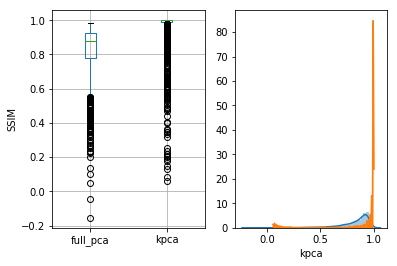

In [51]:
# Let's plot box plot to show dtribution of SSIM value
plt.subplot(1,2,1)
data = pd.DataFrame({'full_pca':full_pca_re, 'kpca':kpca_re})
data.boxplot()
plt.ylabel("SSIM")  

# we can also use sns to plot dtribution
plt.subplot(1,2,2)
import seaborn as sns
sns.distplot(data.full_pca)
sns.distplot(data.kpca)
import warnings
warnings.filterwarnings('ignore')

After normalizing the luminosity we see that the SSIM score between the Kernal PCA images and the original images are extremly high. Kernal PCA really did a good job! We prefer Kernal PCA!

### 4.4 Perform feature extraction upon the images using any feature extraction technique
We use DAISY Bag of Features Model for this.

(3, 3, 128)
1152


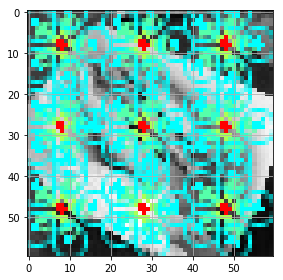

In [52]:
from skimage.io import imshow
from skimage.feature import daisy

# lets first visualize what the daisy descripto looks like
img=convert_to_grey(npX_train[0].reshape((60, 60,3)))
features, img_desc = daisy(img,step=20, radius=8, rings=3, histograms=5, orientations=8, visualize=True)
imshow(img_desc)
plt.grid()
print(features.shape)
print(features.shape[0]*features.shape[1]*features.shape[2])

In [53]:
# create a function to tak in the row of the matric and return a new feature
def apply_daisy(img):
    feat = daisy(img,step=20, radius=8, rings=3, histograms=5, orientations=8, visualize=False)
    return feat.reshape((-1))

%time test_feature = apply_daisy(convert_to_grey(npX_train[0].reshape((60, 60,3))))
test_feature.shape

CPU times: user 33.7 ms, sys: 12 ms, total: 45.7 ms
Wall time: 15.2 ms


(1152,)

In [54]:
0.011 * n_samples # approximate how long it may run

16.5

In [55]:
# caculate the feature of all the samples and vstack to shape a 2d array
# extract feature
def extra_feature(data):
    daisy_features=apply_daisy(convert_to_grey(data[0].reshape((60, 60,3))))
    for i in range(1,data.shape[0]):
        feat=apply_daisy(convert_to_grey(data[i].reshape((60, 60,3))))
        daisy_features=np.vstack([daisy_features,feat])
    return daisy_features
    

In [56]:
# get the feature of tarining set and test set 
train_feature=extra_feature(npX_train)
test_feature=extra_feature(npX_test)

In [57]:
# print(npX_train.shape)

print('There are',train_feature.shape[0],'samples in training set and each sample have',train_feature.shape[1],'features')
print(train_feature.shape)
print('There are',test_feature.shape[0],'samples in test set and each sample have',test_feature.shape[1],'features')
print(test_feature.shape)

There are 1500 samples in training set and each sample have 1152 features
(1500, 1152)
There are 250 samples in test set and each sample have 1152 features
(250, 1152)


### 4.5 Does this feature extraction method show promise for your prediction task?


#### 4.5.1 option 1: just visualize all the feature sample and see if the food with same category tend to group together

In [58]:
# First let's perform T-SNE
from sklearn import manifold, datasets
tsne = manifold.TSNE(n_components=2)
X = train_feature
y=npY_train

%time X_tsne = tsne.fit_transform(X)
print("Org data dimension is {}. Embedded data dimension is {}".format(X.shape[-1], X_tsne.shape[-1]))

CPU times: user 30.6 s, sys: 2.14 s, total: 32.7 s
Wall time: 32.8 s
Org data dimension is 1152. Embedded data dimension is 2


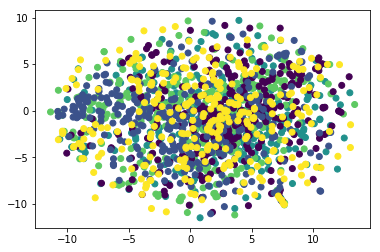

In [59]:
from matplotlib.pyplot import scatter
ax = scatter(X_tsne[:,0], X_tsne[:,1], c=y )
plt.show()

In [60]:
# Seoncd perform PCA
from sklearn.decomposition import PCA

X = train_feature
y=npY_train

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X) # fit data and then transform it
print("Org data dimension is {}. Embedded data dimension is {}".format(X.shape[-1], X_tsne.shape[-1]))

Org data dimension is 1152. Embedded data dimension is 2


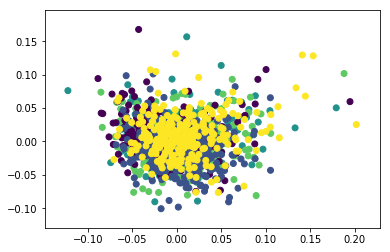

In [61]:
ax = scatter(X_pca[:,0], X_pca[:,1], c=y )
plt.show()

What a mess! The feature may not good! The smaples completely mixed together


#### Option2: use a heat map of the pairwise differences (ordered by class) among all extracted features.

In [62]:
from sklearn.metrics.pairwise import pairwise_distances
from scipy.spatial import distance

# measure intra vs. inter class similarity using the similarity measure above
daisy_features=train_feature
Y_train = np.array(Y_train)
n = len(Label_list)
class_values = np.linspace(0,n-1, n)

#1.) Intra- sum all intra_class_distance_matrix and divide by number of classes
#2.) Inter- sum all inter_class_distance_matrix and divide by number of classes
# plot both

# for each class
N = int(len(Y_train)/n)
M = len(Y_train) - N
sum_intra_class_dist_matrix = np.zeros(shape=(N,N))
sum_inter_class_dist_matrix = np.zeros(shape=(M,N))
print(N,M)

for cv in class_values:
    
    # get all images of that class and compare intra similarity
    indices = np.argwhere(Y_train == cv)
    class_daisy_features = daisy_features[indices][:,0,:]

    # get all images not of that class and compare inter similarity
    mask = np.ones(len(daisy_features), np.bool)
    mask[indices] = 0
    non_class_daisy_features = daisy_features[mask]

    # intra class similarity scores
    # find the pairwise distance between all class images (intra_class_ssim_scores as distance function)
    #%time dist_matrix = pairwise_distances(X=class_image_vectors,Y=class_image_vectors, metric=SSIM)
    intra_class_dist_matrix = pairwise_distances(class_daisy_features)
    sum_intra_class_dist_matrix += intra_class_dist_matrix

    # inter class similarity scores
    inter_class_dist_matrix = pairwise_distances(X=non_class_daisy_features, Y=class_daisy_features)
    sum_inter_class_dist_matrix += inter_class_dist_matrix
 
intra_class_dist_matrix = intra_class_dist_matrix/n
inter_class_dist_matrix = inter_class_dist_matrix/n

300 1200


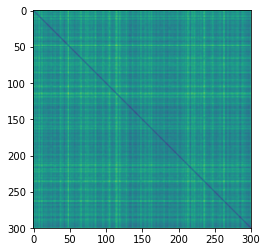

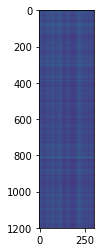

In [63]:

plt.imshow(intra_class_dist_matrix, cmap='viridis', interpolation='bicubic') #interpolation='nearest')
plt.show()

plt.imshow(inter_class_dist_matrix, cmap='viridis', interpolation='bicubic')
plt.show()

#### Option3: build a nearest neighbor classifier to see actual classification performance. 

In [64]:
from sklearn.cross_validation import train_test_split
from sklearn.neighbors import  KNeighborsClassifier

X_train,X_test,Y_train,Y_test = train_test_split(X,y,test_size=0.2)

knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train,Y_train)


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=1, p=2,
           weights='uniform')

In [65]:
score=knn.score(X_test,Y_test,sample_weight=None)
print(score)

0.24666666666666667


## Exceptional Work 

In [66]:
#read image 
img = cv2.imread(r'2556.jpg',cv2.IMREAD_COLOR) 
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY) 
cv2.imshow('origin',img); 
   
#SIFT 
detector = cv2.xfeatures2d.SIFT_create()
keypoints = detector.detect(gray,None) 
cv2.drawKeypoints(gray,keypoints,img) 
#img = cv2.drawKeypoints(gray,keypoints,flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS) 
cv2.imshow('test',img); 
cv2.waitKey(0) 
cv2.destroyAllWindows() 

error: OpenCV(3.4.2) /opt/concourse/worker/volumes/live/9523d527-1b9e-48e0-7ed0-a36adde286f0/volume/opencv-suite_1535558719691/work/modules/imgproc/src/color.hpp:253: error: (-215:Assertion failed) VScn::contains(scn) && VDcn::contains(dcn) && VDepth::contains(depth) in function 'CvtHelper'


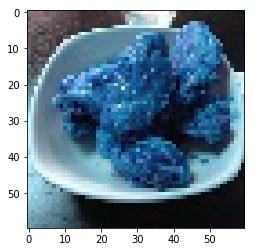

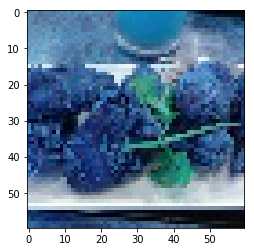

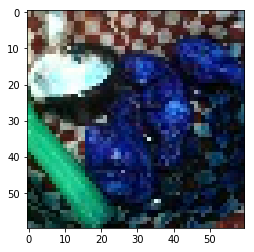

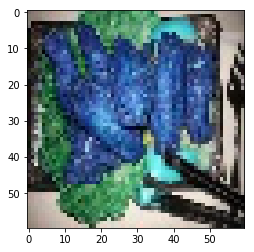

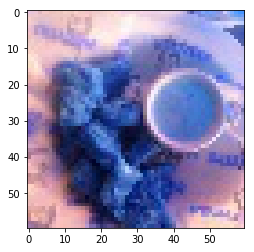

...

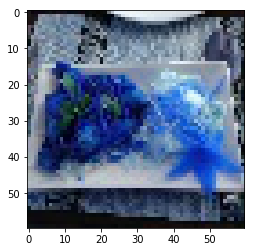

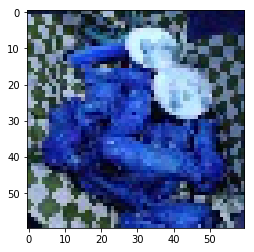

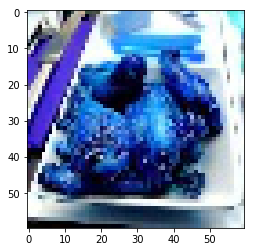

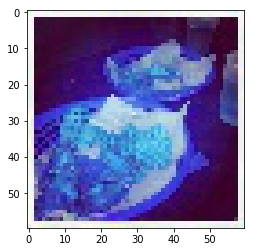

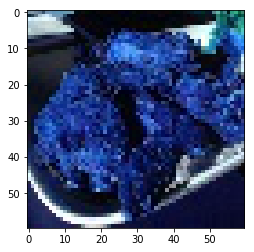

In [86]:
#python 3



import numpy as np
import cv2
import glob
#from sklearn.cluster import MiniBatchKMeans
import random

#
# 	Paths
#

test_images_file_template = "food_resized/train/0_chicken_wings/%s.jpg"
output_template = "output_images/bimage_%s.png"


# crop
#crop_img = img[y:y+h, x:x+w]


def find_keypoints(image, image_number=None):
    img = image.copy()

    # 
    #	Harris detect corners is very good
    #

    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    dst = cv2.cornerHarris(gray,2,3,0.04)
    dst = cv2.dilate(dst,None)
    ret, dst = cv2.threshold(dst,0.01*dst.max(),255,0)
    dst = np.uint8(dst)
    #return True, dst

    # find centroids
    ret, labels, stats, centroids = cv2.connectedComponentsWithStats(dst)

    # define the criteria to stop and refine the corners
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.001)
    corners = cv2.cornerSubPix(gray,np.float32(centroids),(5,5),(-1,-1),criteria)

    #return True, corners

    try:
        # Now draw them
        res = np.hstack((centroids,corners))
        res = np.int0(res)


        img[res[:,1],res[:,0]]=[0,0,255]
        img[res[:,3],res[:,2]] = [0,255,0]

        # 
        # 
        #

        #tuple_float2int = lambda t: tuple(int(e) for e in t)
        np_2_tupple_int = lambda t: tuple(int(e) for e in tuple(t))
        for corner in corners:
            center = np_2_tupple_int(corner)
            # draw match point on image
            radius = 3
            color = (255,0,0)
            cv2.circle(img, center, radius, color, thickness=6, lineType=8, shift=0)
    except:
        pass
    
    return True, img

def orb_keypoints(img):

    # Initiate ORB detector
    orb = cv2.ORB_create()

    # find the keypoints with ORB
    #1.) kp = orb.detect(img,None)

    # compute the descriptors with ORB
    #2.) kp, des = orb.compute(img, kp)

    # or combine (1,2) in single line
    kp, des = orb.detectAndCompute(img, None)

    # draw only keypoints location,not size and orientation
    img2 = cv2.drawKeypoints(img,kp,color=(0,255,0), flags=0, outImage=np.array([]))
    #img2 = cv2.drawKeypoints(img, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    return img2



images = glob.glob(test_images_file_template % '*')
image_counter = 1
for fname in images:
    img = cv2.imread(fname)

    # resize image for faster operations


    img_size = tuple(img.shape[:2])
    

    # tmp
    bimage = img

    #ret, bimage = find_keypoints(img, image_number=image_counter)
    bimage = orb_keypoints(bimage)

    if ret:
        cv2.imwrite(output_template % image_counter, bimage) # tmp corners
    image_counter += 1



